# Семинар № 7

# RANSAC для поиска фигур№

In [1]:
import math

import matplotlib.pyplot as plt
import numpy as np
from sklearn import linear_model, datasets
from skimage.measure import LineModelND, ransac
import pandas as pd


In [2]:
df = pd.read_csv('data/scan_data.txt',delimiter=',')
angle = df.values[:,0]
distance = df.values[:,1]
cartesian = [(r*math.cos(phi*math.pi/180), r*math.sin(phi*math.pi/180)) for r, phi in zip(distance, angle)]
x, y = map(list, zip(*cartesian))

# coverting this into 2d array
x_data =  np.array(x)
y_data =  np.array(y)

In [3]:
def distance(x1,y1,x2,y2):
    return np.sqrt((x1-x2)**2 + (y1-y2)**2)

In [4]:
x_segments = []
y_segments = []

start = 0
distances = []

for i in range(len(x_data)-1):
    distance_to_point = distance(x_data[i], y_data[i], x_data[i+1], y_data[i+1])
    distances.append(distance_to_point)
    if distance_to_point > 200:
        if i-start>10:
            x_segments.append(x_data[start:i])
            y_segments.append(y_data[start:i])
        start = i+1
    if i == len(x_data)-2:
        if i-start>10:
            x_segments.append(x_data[start:i])
            y_segments.append(y_data[start:i])

In [5]:
def plot_ransac(segment_data_x, segment_data_y):
    data = np.column_stack([segment_data_x, segment_data_y])

    # fit line using all data
    model = LineModelND()
    model.estimate(data)

    # robustly fit line only using inlier data with RANSAC algorithm
    model_robust, inliers = ransac(data, LineModelND, min_samples=2,
                                   residual_threshold=5, max_trials=1000)
    outliers = inliers == False

    # generate coordinates of estimated models
    line_x = np.array([segment_data_x.min(), segment_data_x.max()])
    line_y = model.predict_y(line_x)
    line_y_robust = model_robust.predict_y(line_x)
    
    k = (line_y_robust[1] - line_y_robust[0])/(line_x[1]- line_x[0])
    m = line_y_robust[0] - k*line_x[0]
    x0 = (segment_data_y.min() - m)/k
    x1 = (segment_data_y.max() - m)/k
    line_x_y = np.array([x0, x1])
    line_y_robust_y = model_robust.predict_y(line_x_y)
    
    if (distance(line_x[0], line_y_robust[0], line_x[1], line_y_robust[1]) <
    distance(line_x_y[0], line_y_robust_y[0], line_x_y[1], line_y_robust_y[1])):
        plt.plot(line_x, line_y_robust, '-b', label='Robust line model')
    else:
        plt.plot(line_x_y, line_y_robust_y, '-b', label='Robust line model')

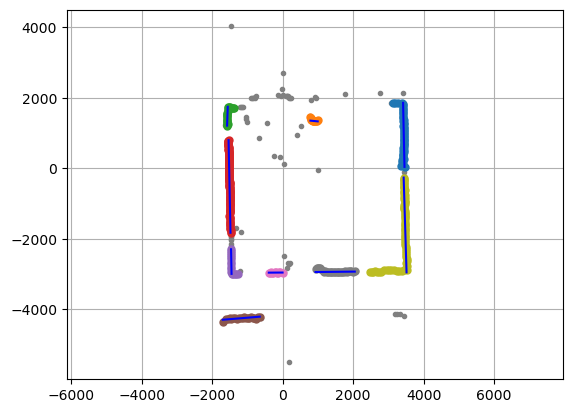

In [6]:
plt.plot(x_data, y_data, '.', color = 'grey')

for x_seg, y_seg in zip(x_segments, y_segments):
    plt.plot(x_seg, y_seg,'.', markersize = 10)
    plot_ransac(x_seg, y_seg)

plt.axis('equal')
plt.grid()
plt.show()

## TODO


Есть предожение сделать такую задачу - нужно найти квадрат в облаке точек. К модельным данным выше добавить шума и "ложных" фигур. Потребовать найти квадрат с нужной стороной.

# RANSAC для сегментации 3D точек

Перенести описание из туториала -- https://towardsdatascience.com/3d-model-fitting-for-point-clouds-with-ransac-and-python-2ab87d5fd363

In [7]:
import random
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d

import plotly.express as px

# План

Во-первых, (1) мы выбрали данные, состоящие из облака точек. Затем (2) мы выбираем одну геометрическую модель (плоскость) для обнаружения в данных. (3) Определям параметры модели, которые будем изучать. (4) Добавляем к первым трем пунктам RANSAC. (5) Сегментируем наше облако(а) точек

<table><tr>
    <td> <img src="img/plan.png" alt="Drawing" style="width: 1100px;"/> </td>    
</tr></table>

## Шаг 1,2 и 3: Выбор датасета и настройка параметров

## Данные из облака точек

<table><tr>
    <td> <img src="img/robot.png" alt="Drawing" style="width: 700px;"/> </td>    
</tr></table>


In [51]:
#Load the file
dataset="data/the_researcher_desk.xyz"
pcd = np.loadtxt(dataset,skiprows=1)

print(pcd.shape)

#Store in two variables
xyz=pcd[:,:3]
rgb=pcd[:,3:6]

(159893, 6)


## Подбор параметров вручную

Нам нужно определить пороговый параметр, чтобы определить, принадлежит ли точка подобранной плоской форме (внутреннему элементу) или является выбросом. Мы будем основывать наш выбор на подсчете расстояния от точки до плоскости. Давайте отобразим облако точек с помощью matplotlib:

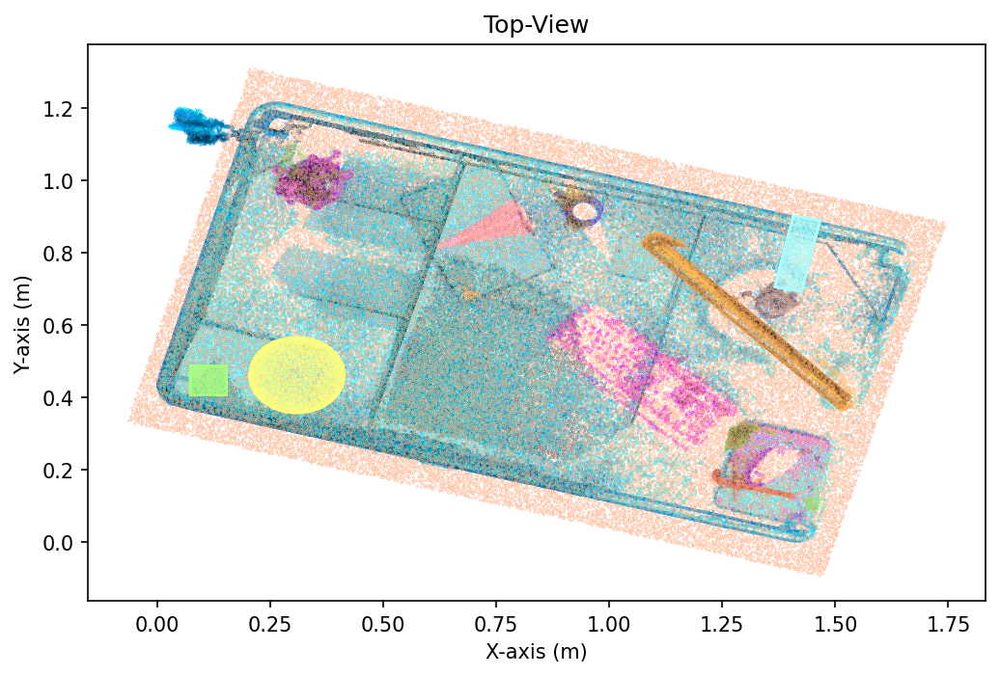

In [9]:
#Vizualising on the two axes to select the filter
plt.figure(figsize=(8, 5), dpi=150)
plt.scatter(xyz[:,0], xyz[:,1], c=rgb/255, s=0.05)
plt.title("Top-View")
plt.xlabel('X-axis (m)')
plt.ylabel('Y-axis (m)')
plt.show()

Иногда бывает сложно увидеть, что разделяет две точки, особенно при использовании Google Colab и неинтерактивных рендерингов. Если вы находитесь в таком сценарии, вы можете использовать plotly с import plotly.express as px, а затем вы можете получить фигуру с помощью

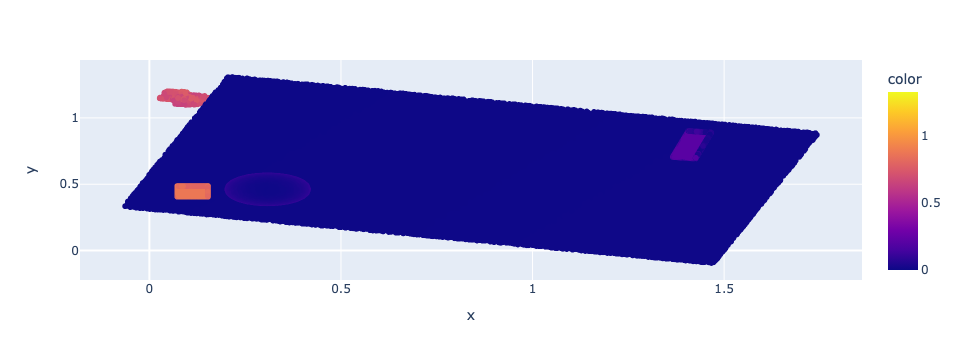

In [52]:
#for interactive plotting
fig = px.scatter(x=xyz[:,0], y=xyz[:,1], color=xyz[:,2])
fig.show()

Это позволяет нам увидеть, что в среднем расстояние между двумя соседними точками составляет 5 мм, поэтому мы устанавливаем порог в десять раз выше (абсолютно эмпирически): порог=0,05. Таким же образом мы установим значительное количество итераций, скажем, 1000 итераций:

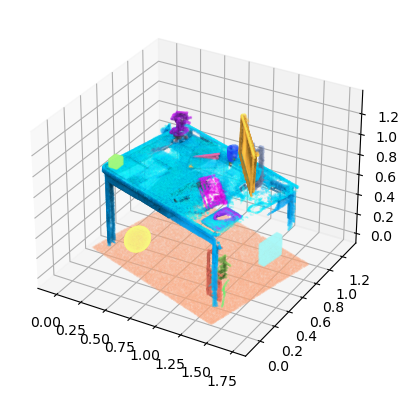

In [11]:
ax = plt.axes(projection='3d')
ax.scatter(xyz[:,0], xyz[:,1], xyz[:,2], c = rgb/255, s=0.01)
plt.show()

## Автоматический подбор параметров

Мы можем быть немного ограничены из-за необходимости иметь некоторые знания в предметной области для установки порога. Поэтому было бы интересно попытаться обойти это. Поделюсь с вами простой мыслью, которая может оказаться полезной. Что, если бы мы вычислили среднее расстояние между точками в наших наборах данных и использовали его в качестве основы для установки порога?

Что ж, эту идею стоит изучить. Чтобы попытаться определить такое значение, мы могли бы использовать KD-дерево, чтобы ускорить процесс запроса ближайших соседей для каждой точки. На этом этапе процесса я рекомендую использовать реализацию scikit-learn и разделить KD-дерево в каждом узле на две гиперплоскости:

In [12]:
from sklearn.neighbors import KDTree

Оттуда мы можем затем запросить k-ближайших соседей для каждой точки в облаке точек с помощью простого метода запроса:

In [59]:
tree = KDTree(np.array(xyz), leaf_size=2)
tree.query(xyz, k=8)

(array([[0.        , 0.00435211, 0.00557381, ..., 0.01096507, 0.0110168 ,
         0.0119667 ],
        [0.        , 0.00479268, 0.00516036, ..., 0.00636027, 0.00651869,
         0.00663628],
        [0.        , 0.00416396, 0.00546193, ..., 0.00688026, 0.00719481,
         0.00736822],
        ...,
        [0.        , 0.00521487, 0.00597947, ..., 0.0078336 , 0.0080864 ,
         0.00816575],
        [0.        , 0.00402118, 0.00418074, ..., 0.00765553, 0.00837773,
         0.00897464],
        [0.        , 0.00468967, 0.00504667, ..., 0.0076025 , 0.00791635,
         0.00886654]]),
 array([[     0,     24,  49925, ...,     46,  49886,  49872],
        [     1,  49898,     40, ...,  49943,     28,     32],
        [     2,     28,     36, ...,    105,    135,     32],
        ...,
        [159890, 159811, 159440, ..., 159593, 159817, 159477],
        [159891, 159523, 159684, ..., 159540, 159210, 158006],
        [159892, 159461, 159538, ..., 159433, 159689, 159756]]))

 **Примечание**: первое значение расстояния до ближайшего соседа всегда равно 0. Странно, спросите вы? Это связано с тем, что мы запрашиваем расстояние от всех точек из облака по отношению ко всем ближайшим точкам из того же облака, таким образом, каждая точка считает также расстояние до самой себя. Поэтому нам нужно фильтровать первый элемент в каждой строке

In [25]:
nearest_dist, nearest_ind = tree.query(xyz, k=8)
mean_distance = np.mean(nearest_dist[:,1:], axis = 0)

Итак, теперь, если мы усредним значения по каждому соседу, отсортированному от ближайшего к самому дальнему с помощью np.mean(nearest_dist[:,1:],axis=0), мы получим:

In [60]:
mean_distance

array([0.00462562, 0.0052954 , 0.00599643, 0.00672068, 0.00744045,
       0.0081288 , 0.00875479])

Это означает, что если бы мы рассматривали расстояние только до ближайшего соседа, мы бы получили среднее расстояние 4,6 мм. Если бы мы были в сценарии, в котором мы хотели получить локальное представление среднего расстояния каждой точки до ее n-х ближайших соседей, используя np.mean(nearest_dist[:,1:]), в нашем случае мы получим 6,7 мм.

In [27]:
np.mean(nearest_dist[:,1:])

0.0067088820233520245

Чтобы ваши эксперименты проходили гладко, я рекомендую использовать от 8 до 15 точек, взятых в качестве соседей, и усреднить полученные значения

## Шаг 4. Fitting модели RANSAC

 Эксперты: существует автоматический способ получить правильное количество итераций. Если мы хотим добиться успеха с вероятностью p (например, 99%), коэффициент выбросов в наших данных равен e (например, 60%), и нам нужно s точек для определения нашей модели (здесь 3). Приведенная ниже формула дает нам количество попыток (итераций), которые необходимо выполнить:

<table><tr>
    <td> <img src="img/eq.png" alt="Drawing" style="width: 300px;"/> </td>    
</tr></table>



### A. Поиск плоскости

Давайте смоделируем одну итерацию, прежде чем выполнять указанное количество итераций.

Прежде всего, нам нужно выбрать три случайные точки из облака точек:

In [28]:
idx_samples = random.sample(range(len(xyz)), 3)
pts = xyz[idx_samples]

Затем мы хотим определить уравнение плоскости. Например, нахождение параметров **𝑎,𝑏,𝑐** и 𝑑 уравнения **𝑎𝑥+𝑏𝑦+𝑐𝑧+𝑑=0**. Для этого мы можем поиграть с фантастическим свойством линейной алгебры, которое гласит, что векторное произведение двух векторов порождает ортогональный им.

Таким образом, нам просто нужно определить два вектора из одной и той же точки на плоскостях vecA и vecB, а затем вычислить к ним нормаль, которая затем будет нормалью плоскости.

In [62]:
vecA = pts[1] - pts[0]
vecB = pts[2] - pts[0]
normal = np.cross(vecA, vecB)

Далее мы нормализуем наш вектор нормали, получаем 𝑎, 𝑏 и 𝑐, определяющие вектор, и найдем коэффициент 𝑑, используя одну из трех точек, падающих на плоскость: **d = — (𝑎𝑥+𝑏𝑦+𝑐𝑧) **

In [30]:
a,b,c = normal / np.linalg.norm(normal)
d=-np.sum(normal*pts[1])

И теперь мы готовы приступить к вычислению любой оставшейся точки плоскости, которую мы только что определили.

### B. Расстояние от точки до плоскости. Определение порога

Если вы верите мне на слово, вот что нам нужно реализовать:

<table><tr>
        <td> <img src="img/eq2.png" alt="Drawing" style="width: 700px;"/> </td>    

</tr></table>


Это расстояние является самым коротким и представляет собой ортогональное расстояние между точкой и плоскостью, как показано ниже.

<table><tr>
        <td> <img src="img/eq3.png" alt="Drawing" style="width: 700px;"/> </td>    

</tr></table>

Это означает, что мы можем просто вычислить это расстояние, взяв каждую точку в облаке точек, которая не является частью трех, которые мы использовали для создания плоскости за одну итерацию RANSAC, вот так:

In [63]:
distance = (a * xyz[:,0] + b * xyz[:,1] + c * xyz[:,2] + d
            ) / np.sqrt(a ** 2 + b ** 2 + c ** 2)

Что для нашего случайного выбора и соответствия плоскости выходным данным получилось

In [47]:
distance

array([ 0.79543053,  0.78483745,  0.78649956, ..., -0.00227423,
        0.18321755,  0.05184622])

**Примечание**. Видите **отрицательные** значения? Нам придется решить эту проблему, чтобы получить беззнаковые расстояния, потому что нашу нормаль можно переворачивать на плоскости на 180°.

После этого мы можем просто проверить пороговое значение и отфильтровать все точки, отвечающие критерию, чтобы оставить в качестве вложенных только точки с расстоянием от точки до плоскости ниже порогового значения.

In [64]:
idx_inliers = []  # list of inliers ids
inliers = []
threshold=0.05
idx_candidates = np.where(np.abs(distance) <= threshold)[0]
if len(idx_candidates) > len(inliers):
    equation = [a,b,c,d]
    inliers = idx_candidates

Результат **одной** итерации. В цвете cyan плоскость соответствует трем точкам выборки. Цветом blue выделены точки, выбранные в качестве inliers.

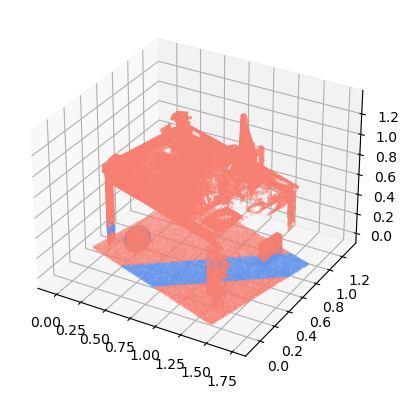

In [50]:
xyz_in=xyz[inliers]

mask = np.ones(len(xyz), dtype=bool)
mask[inliers] = False

xyz_out=xyz[mask]

ax = plt.axes(projection='3d')
ax.scatter(xyz_in[:,0], xyz_in[:,1], xyz_in[:,2], c = 'cornflowerblue', s=0.02)
ax.scatter(xyz_out[:,0], xyz_out[:,1], xyz_out[:,2], c = 'salmon', s=0.02)
plt.show()

### C. Определение функции и увеличение количества итераций


**Примечание**: мы создаем цикл RANSAC для параметра итерации. Для каждого цикла мы вычислим наиболее подходящую плоскость RANSAC и сохраним как уравнение, так и индексы inliers. Затем с помощью оператора if мы проверим, является ли score текущей итерации самым большим, и в этом случае меняем индексы точек.

In [39]:
def ransac_plane(xyz, threshold=0.05, iterations=1000):
    inliers=[]
    n_points=len(xyz)
    i=1

    while i<iterations:
        idx_samples = random.sample(range(n_points), 3)
        pts = xyz[idx_samples]

        vecA = pts[1] - pts[0]
        vecB = pts[2] - pts[0]
        normal = np.cross(vecA, vecB)
        a,b,c = normal / np.linalg.norm(normal)
        d=-np.sum(normal*pts[1])

        distance = (a * xyz[:,0] + b * xyz[:,1] + c * xyz[:,2] + d
                    ) / np.sqrt(a ** 2 + b ** 2 + c ** 2)

        idx_candidates = np.where(np.abs(distance) <= threshold)[0]

        if len(idx_candidates) > len(inliers):
            equation = [a,b,c,d]
            inliers = idx_candidates

        i+=1
    return equation, inliers

## Шаг 5. Бинарная сегментация облака точек


Это последний шаг! По крайней мере, на этом этапе. Результаты функции сохраним в двух переменных:

In [68]:
eq,idx_inliers=ransac_plane(xyz,0.01)
inliers=xyz[idx_inliers]


Но теперь мы также хотим разделить исходное облако точек и эффективно выявить outliers. Вот отличный выход. Мы создадим маску, которая будет действовать как быстрый фильтр для получения остальных точек, не принадлежащих inliers:

In [69]:
mask = np.ones(len(xyz), dtype=bool)
mask[idx_inliers] = False

outliers=xyz[mask]

Превосходно! Теперь у нас есть набор inlier и набор outlier! Давайте проверим результаты с помощью matplotlib:

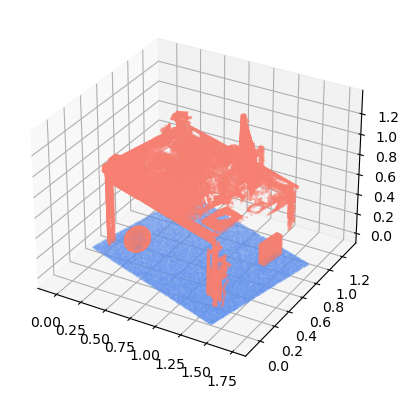

In [70]:
ax = plt.axes(projection='3d')
ax.scatter(inliers[:,0], inliers[:,1], inliers[:,2], c = 'cornflowerblue', s=0.02)
ax.scatter(outliers[:,0], outliers[:,1], outliers[:,2], c = 'salmon', s=0.02)
plt.show()

Вау, это очень хорошо работает! Мы нашли пол в этой сцене! Как здорово! И последнее: экспорт обоих наборов данных

In [ ]:
result_folder="../DATA/RESULTS/"
np.savetxt(result_folder+dataset.split(".")[0]+"_inliers.xyz", inliers, fmt='%1.4f', delimiter=';')
np.savetxt(result_folder+dataset.split(".")[0]+"_outliers.xyz", outliers, fmt='%1.4f', delimiter=';')